## Messi Pass Clustering Experiment

Description: 
    
This is an initial collection of experiments. The overarching goal is to develop a method for characterizing the passing, and other actions of a particular player. 

Because the related Dash App uses statsbomb freely available data, this notebook and related tools will also be built for those data

In [1]:
from statsbombpy import sb
import sbutilities as sbut
import soccerplotly as socly

import pandas as pd
import numpy as np 

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

from scipy.cluster.vq import whiten, vq, kmeans
from numpy import random

In [5]:
all_comps = sb.competitions()


credentials were not supplied. open data access only


,competition_id,season_id,country_name,competition_name,competition_gender,competition_youth,competition_international,season_name,match_updated,match_updated_360,match_available_360,match_available
0,16,4,Europe,Champions League,male,False,False,2018/2019,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2021-07-09T14:06:05.802
1,16,1,Europe,Champions League,male,False,False,2017/2018,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2021-01-23T21:55:30.425330
2,16,2,Europe,Champions League,male,False,False,2016/2017,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2020-07-29T05:00
3,16,27,Europe,Champions League,male,False,False,2015/2016,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2020-07-29T05:00
4,16,26,Europe,Champions League,male,False,False,2014/2015,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2020-07-29T05:00
5,16,25,Europe,Champions League,male,False,False,2013/2014,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2020-07-29T05:00
6,16,24,Europe,Champions League,male,False,False,2012/2013,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2021-07-10T13:41:45.751
7,16,23,Europe,Champions League,male,False,False,2011/2012,2021-08-27T11:26:39.802832,2021-06-13T16:17:31.694,None,2020-07-29T05:00
8,16,22,Europe,Champions League,male,False,False,2010/2011,2022-01-26T21:07:11.033473,2021-06-13T16:17:31.694,None,2022-01-26T21:07:11.033473
9,16,21,Europe,Champions League,male,False,False,2009/2010,2022-02-12T16:13:49.294747,2021-06-13T16:17:31.694,None,2022-02-12T16:13:49.294747


In [9]:
all_comps = sb.competitions()
laliga_comp_id = 11

#----
laliga_season_ids = all_comps[all_comps['competition_id']==laliga_comp_id]['season_id'].to_list()
season_names = all_comps[all_comps['competition_id']==laliga_comp_id]['season_name'].tolist()
season_names = [s.replace('/','-') for s in season_names]

credentials were not supplied. open data access only


array([[90, '2020/2021'],
       [42, '2019/2020'],
       [4, '2018/2019'],
       [1, '2017/2018'],
       [2, '2016/2017'],
       [27, '2015/2016'],
       [26, '2014/2015'],
       [25, '2013/2014'],
       [24, '2012/2013'],
       [23, '2011/2012'],
       [22, '2010/2011'],
       [21, '2009/2010'],
       [41, '2008/2009'],
       [40, '2007/2008'],
       [39, '2006/2007'],
       [38, '2005/2006'],
       [37, '2004/2005']], dtype=object)

In [10]:
season = laliga_season_ids[1]
#---
season_match_ids = sb.matches(competition_id=laliga_comp_id, season_id=season)['match_id'].tolist()

matches_dict = {s : }

credentials were not supplied. open data access only


In [146]:
selected_player = 'Lionel Andrés Messi Cuccittini'

dfs_season_passes = []
for match_id_i in season_match_ids:
#---
    i_events = sb.events(match_id=match_id_i, split=True, flatten_attrs=True)
    i_passes = i_events['passes']
    i_passes = i_passes[i_passes['player']==selected_player]
    #---
    dfs_season_passes.append(i_passes)

df_season_passes = pd.concat(dfs_season_passes)


credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data access only
credentials were not supplied. open data acces

TypeError: to_pickle() got an unexpected keyword argument 'index'

In [2]:
# df_season_passes.to_pickle('messi_passes_season_1.pkl')
df_season_passes = pd.read_pickle('messi_passes_season_1.pkl')
df_season_passes

,id,index,period,timestamp,minute,second,type,possession,possession_team,play_pattern,...,pass_aerial_won,pass_goal_assist,pass_outswinging,counterpress,pass_inswinging,pass_no_touch,pass_miscommunication,pass_straight,pass_deflected,out
91,7fd8d8f3-67bc-489d-8593-3314796fd093,302,1,00:06:36.538,6,36,Pass,12,Barcelona,From Throw In,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
110,76cc29e4-cefd-4566-8ca7-b8625328c2ef,365,1,00:07:38.563,7,38,Pass,14,Barcelona,From Throw In,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
121,6cd979ea-4c01-486a-b4c1-4ba5eb35e86c,405,1,00:08:17.880,8,17,Pass,14,Barcelona,From Throw In,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
132,d8ce677d-6722-4b12-ab55-37d903202abb,448,1,00:09:03.883,9,3,Pass,15,Barcelona,From Throw In,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
173,5fad1427-846b-42be-850d-53ed55a2778f,596,1,00:12:16.254,12,16,Pass,23,Barcelona,From Free Kick,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,23d56147-f72d-4623-bb1a-765c7a705dd4,3481,2,00:40:15.888,85,15,Pass,151,Barcelona,From Keeper,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
994,c9b85dca-6c3a-451c-a954-b864a5f3f447,3492,2,00:40:27.554,85,27,Pass,151,Barcelona,From Keeper,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1002,bb997023-619f-444d-8cdb-0d6497dfe514,3522,2,00:41:09.033,86,9,Pass,155,Barcelona,Regular Play,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1013,92fe634c-e241-4cc3-99c8-2f569bcd7bfd,3568,2,00:45:11.020,90,11,Pass,159,Barcelona,Regular Play,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
pass_cluster_feats = ['loc_x', 'loc_y', 'pass_end_location_loc_x',
                     'pass_end_location_loc_y']

excluded = ['pass_height', 'pass_length', 'pass_angle',]
#---
collected_passes = df_season_passes
#---
collected_passes = sbut.expand_sb_location_col(collected_passes)
collected_passes = sbut.expand_sb_location_col(collected_passes, split_col='pass_end_location')
collected_passes = collected_passes[pass_cluster_feats]
collected_passes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2142 entries, 91 to 1017
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   loc_x                    2142 non-null   float64
 1   loc_y                    2142 non-null   float64
 2   pass_end_location_loc_x  2142 non-null   float64
 3   pass_end_location_loc_y  2142 non-null   float64
dtypes: float64(4)
memory usage: 83.7 KB


In [28]:
in_df = collected_passes

num clusters: 10


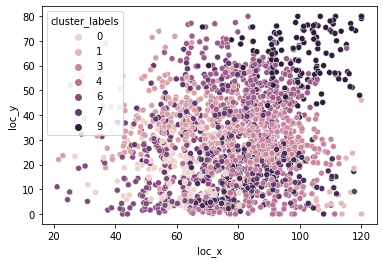

num clusters: 11


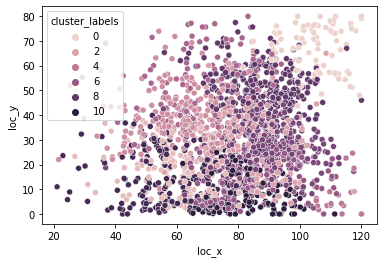

num clusters: 12


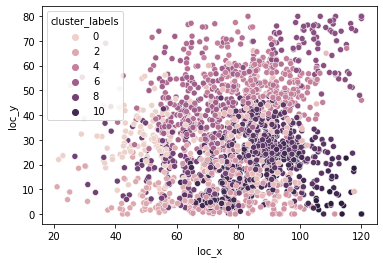

num clusters: 13


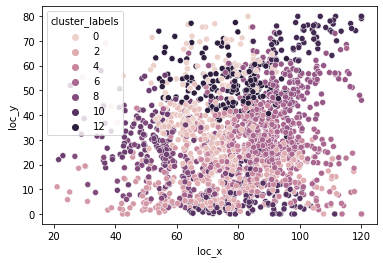

num clusters: 14


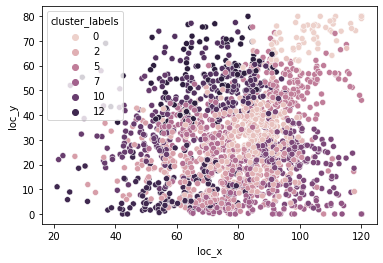

num clusters: 15


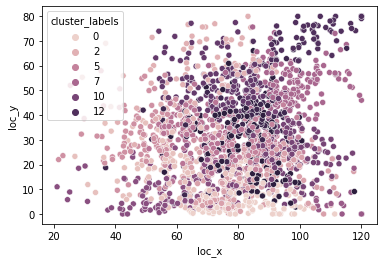

num clusters: 16


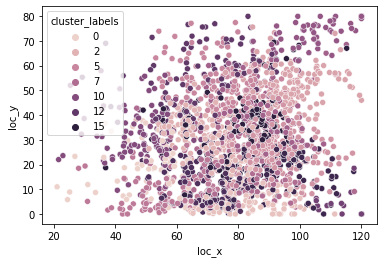

num clusters: 17


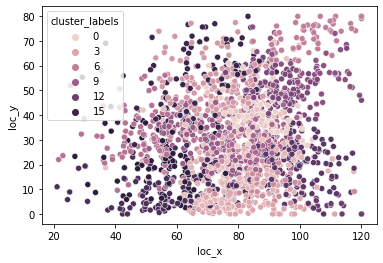

num clusters: 18


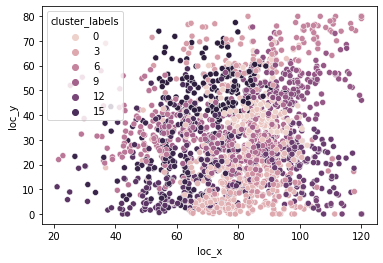

num clusters: 19


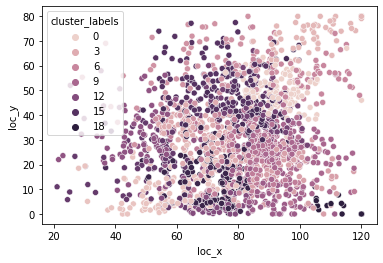

num clusters: 20


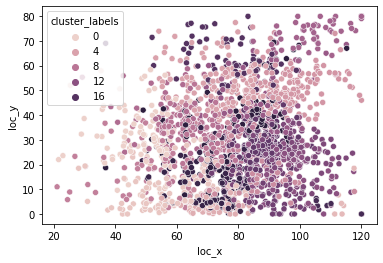

num clusters: 21


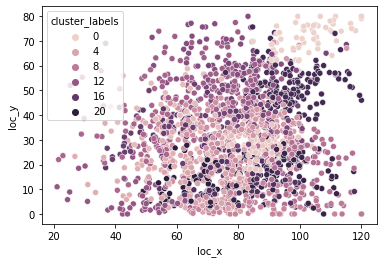

num clusters: 22


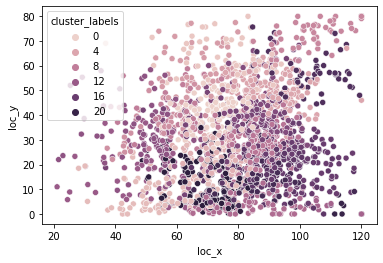

num clusters: 23


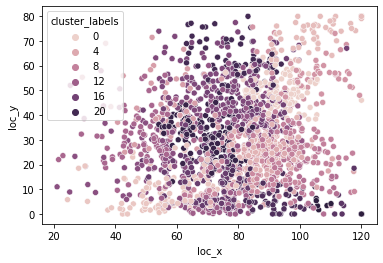

num clusters: 24


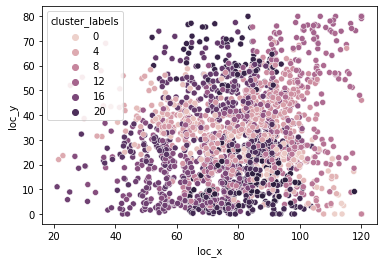

num clusters: 25


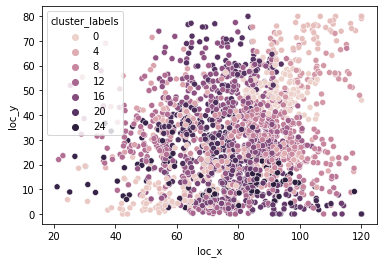

num clusters: 26


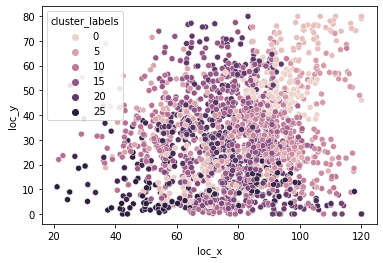

num clusters: 27


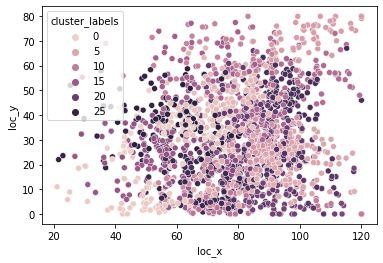

num clusters: 28


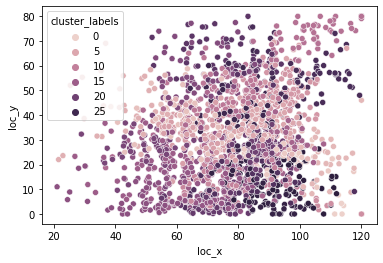

num clusters: 29


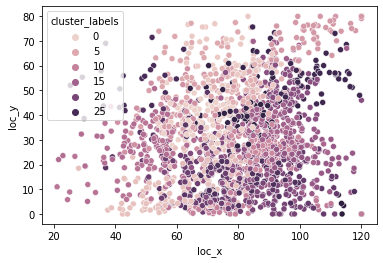

num clusters: 30


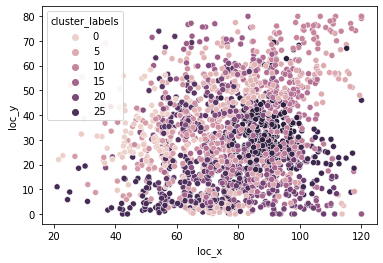

num clusters: 31


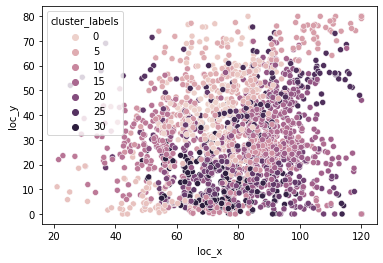

num clusters: 32


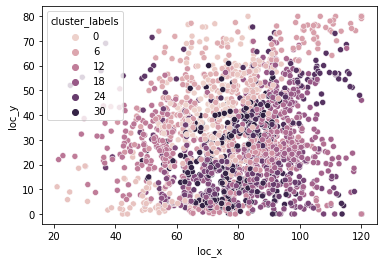

num clusters: 33


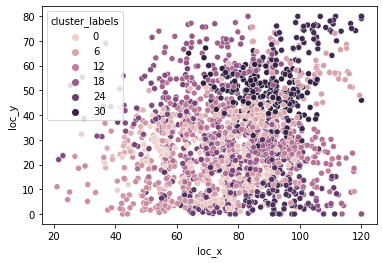

num clusters: 34


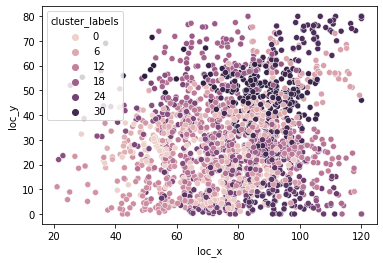

num clusters: 35


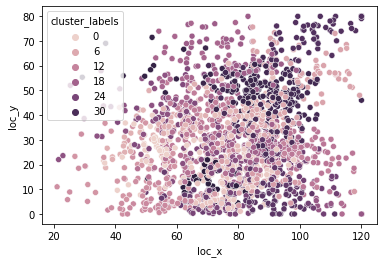

num clusters: 36


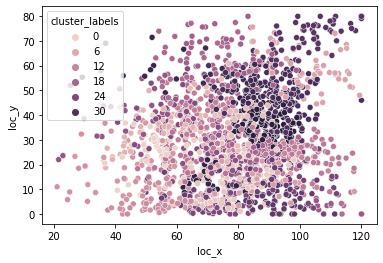

num clusters: 37


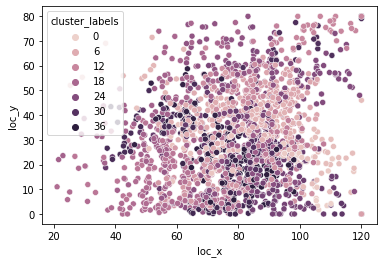

num clusters: 38


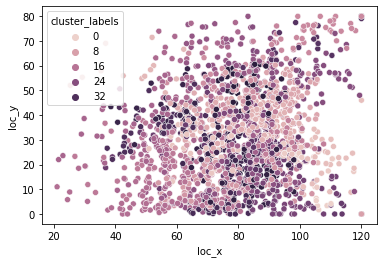

num clusters: 39


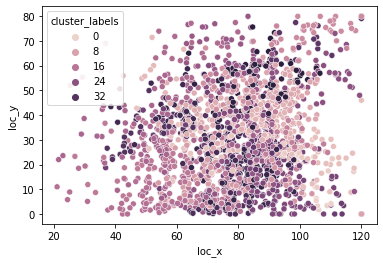

num clusters: 40


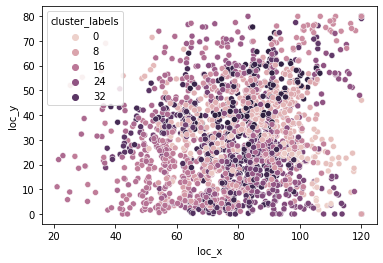

num clusters: 41


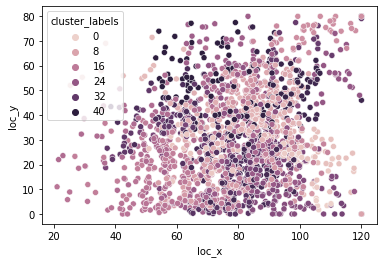

num clusters: 42


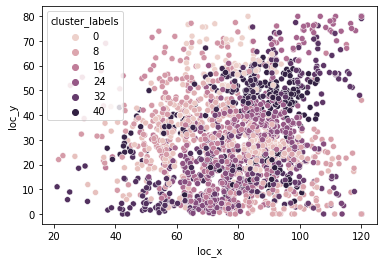

num clusters: 43


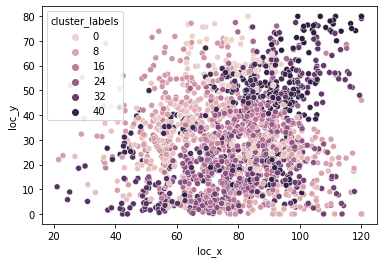

num clusters: 44


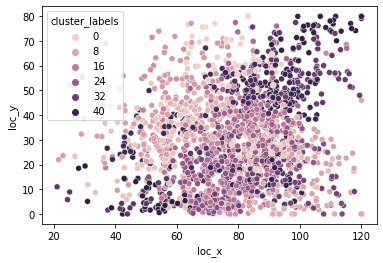

num clusters: 45


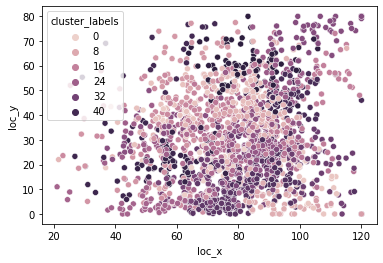

num clusters: 46


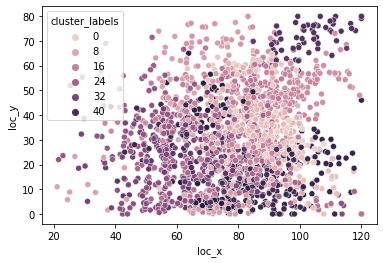

num clusters: 47


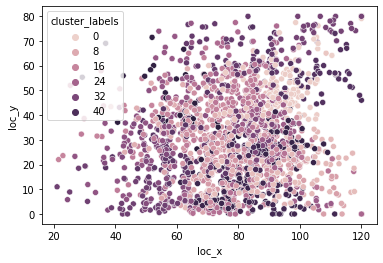

num clusters: 48


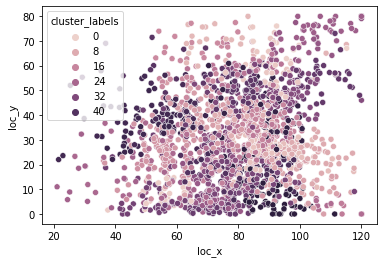

num clusters: 49


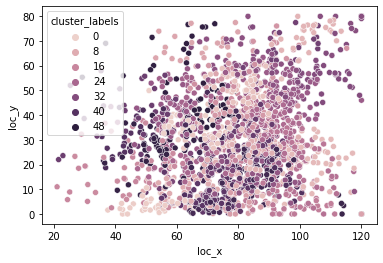

num clusters: 50


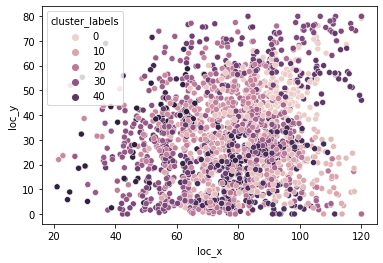

num clusters: 51


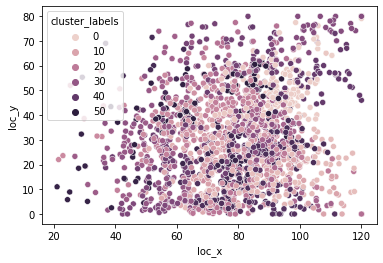

num clusters: 52


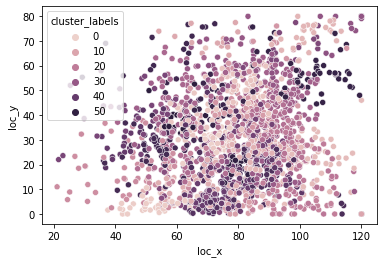

num clusters: 53


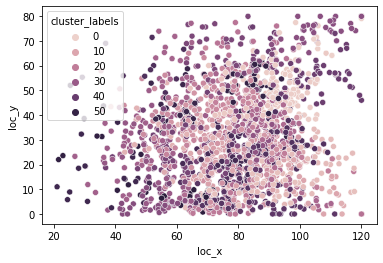

num clusters: 54


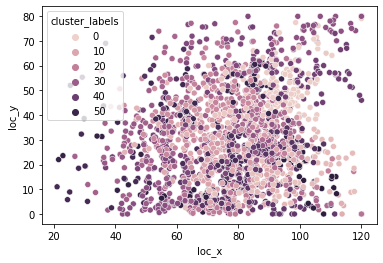

num clusters: 55


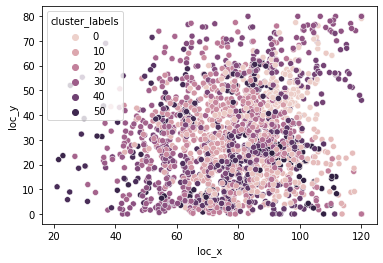

num clusters: 56


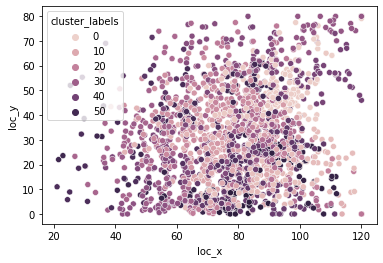

num clusters: 57


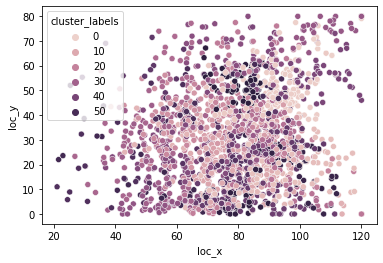

num clusters: 58


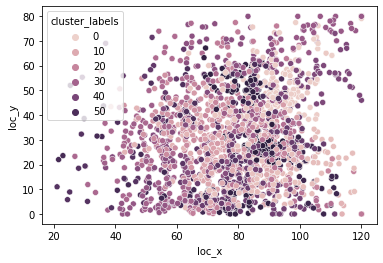

num clusters: 59


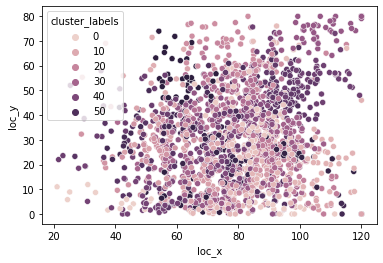

num clusters: 60


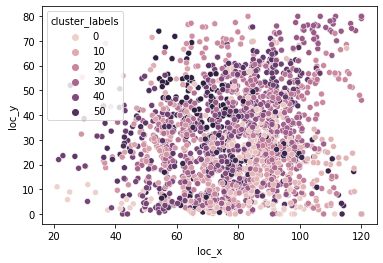

num clusters: 61


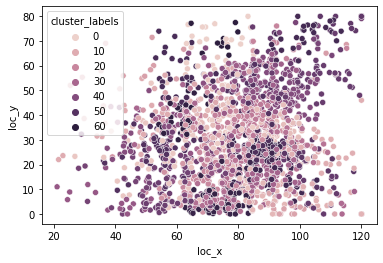

num clusters: 62


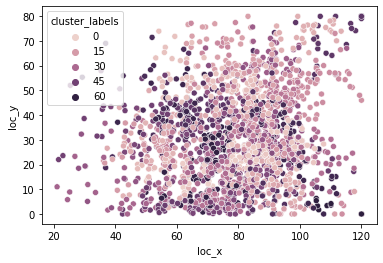

num clusters: 63


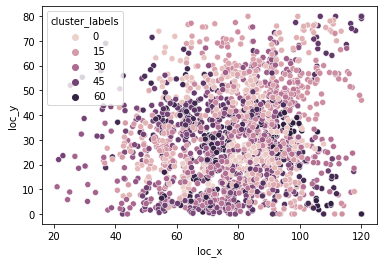

num clusters: 64


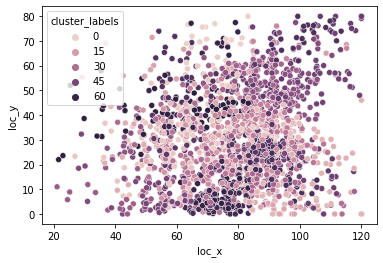

num clusters: 65


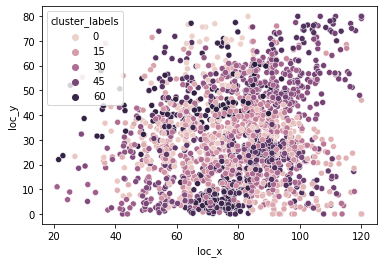

num clusters: 66


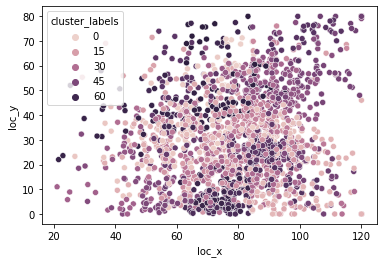

num clusters: 67


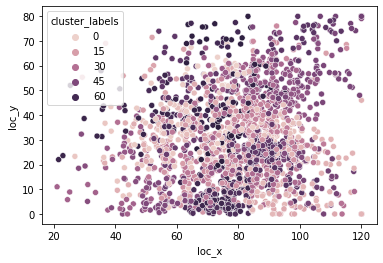

num clusters: 68


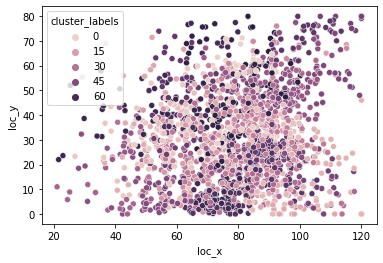

num clusters: 69


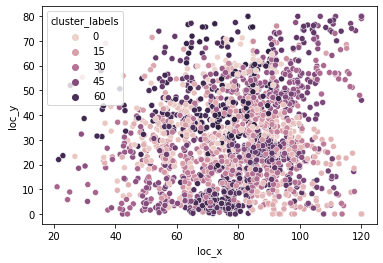

num clusters: 70


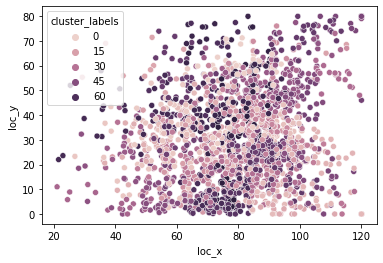

num clusters: 71


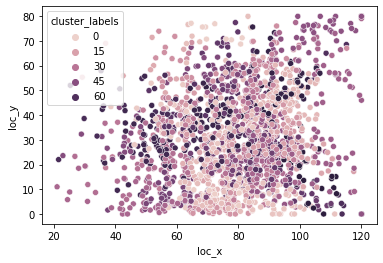

num clusters: 72


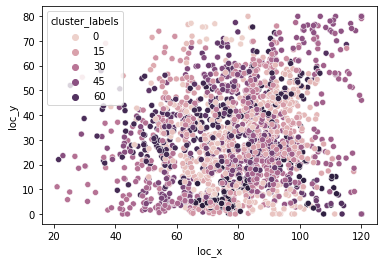

num clusters: 73


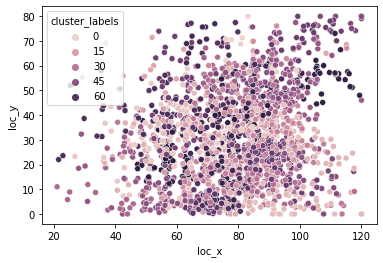

num clusters: 74


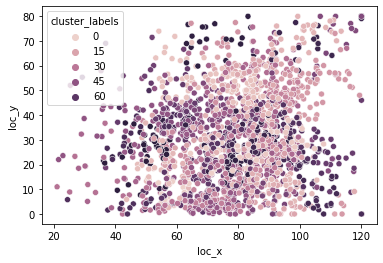

num clusters: 75


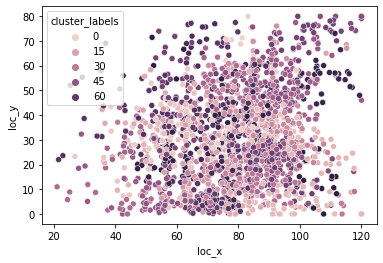

num clusters: 76


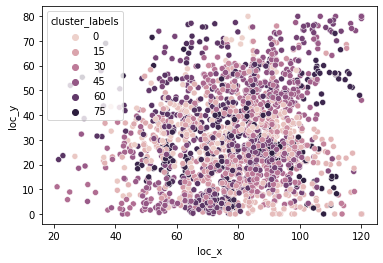

num clusters: 77


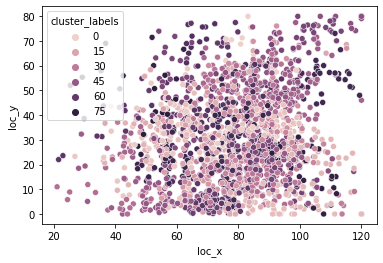

num clusters: 78


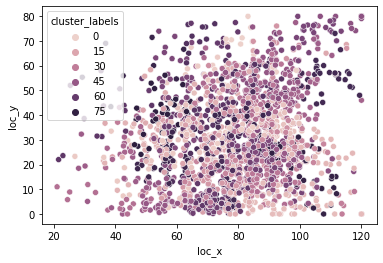

num clusters: 79


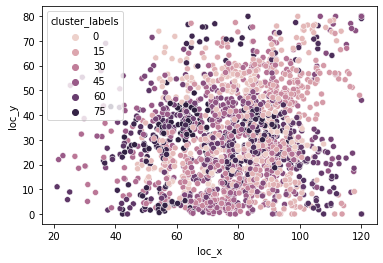

num clusters: 80


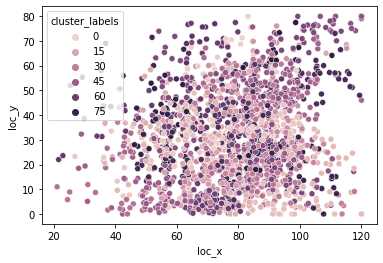

num clusters: 81


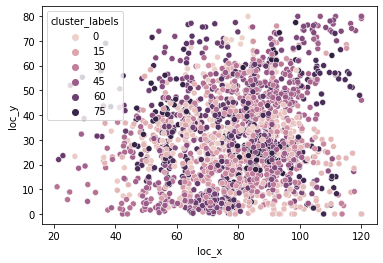

num clusters: 82


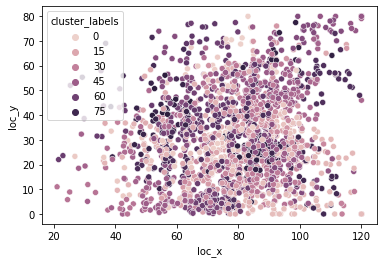

num clusters: 83


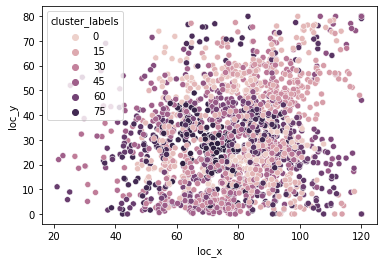

num clusters: 84


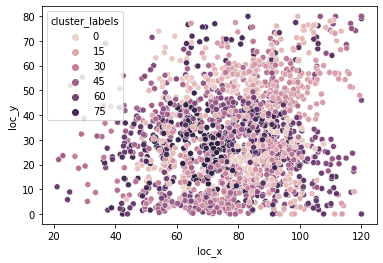

num clusters: 85


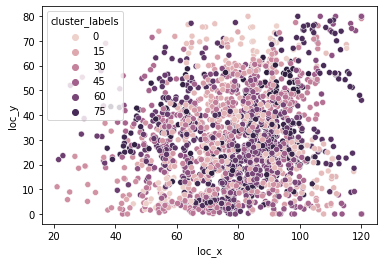

num clusters: 86


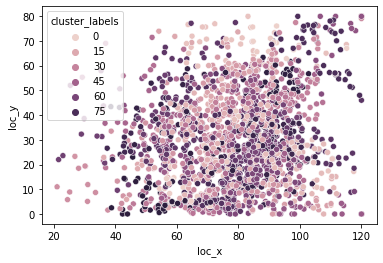

num clusters: 87


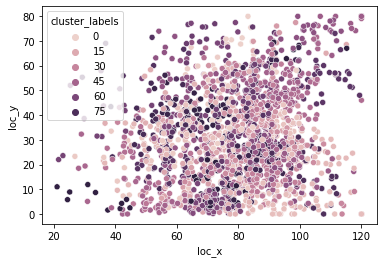

num clusters: 88


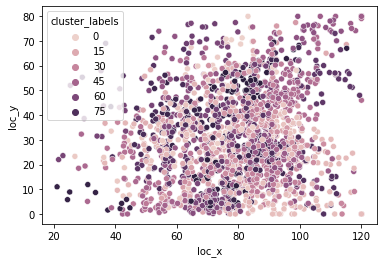

num clusters: 89


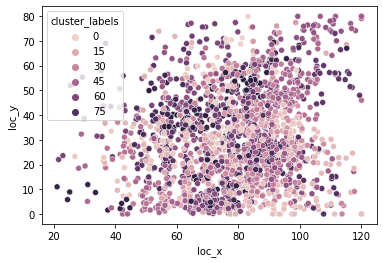

num clusters: 90


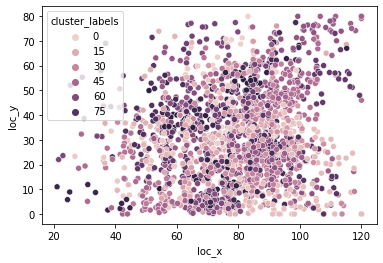

num clusters: 91


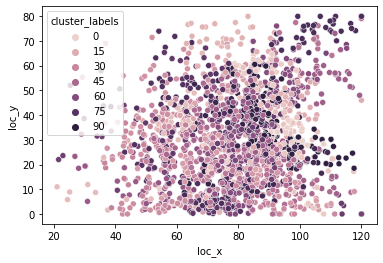

num clusters: 92


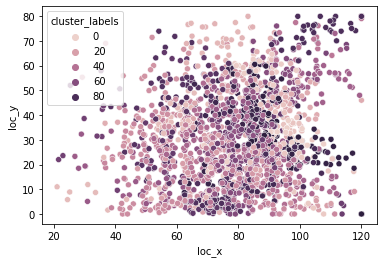

num clusters: 93


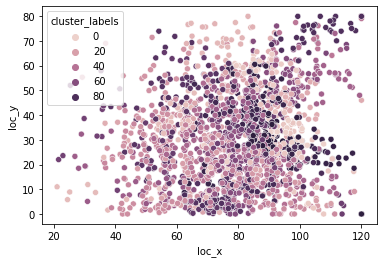

num clusters: 94


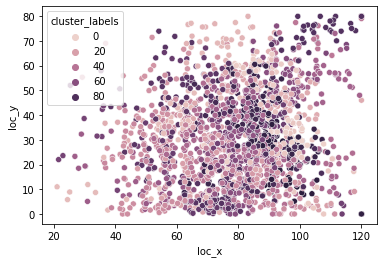

num clusters: 95


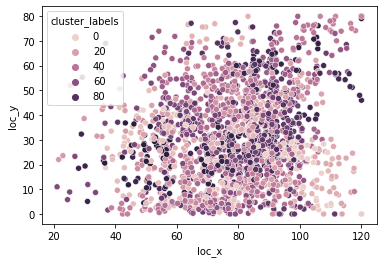

num clusters: 96


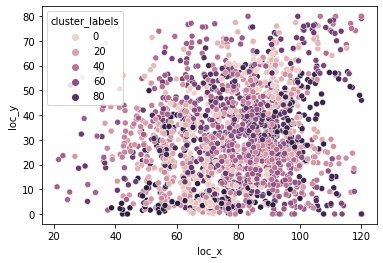

num clusters: 97


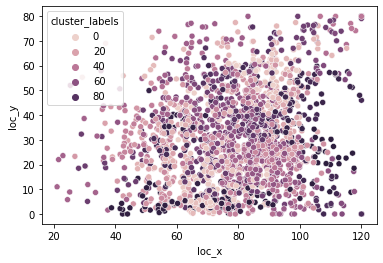

num clusters: 98


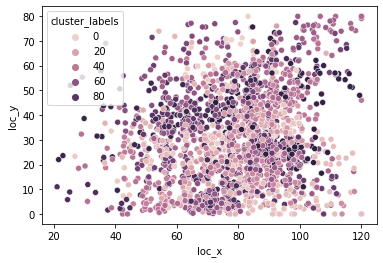

num clusters: 99


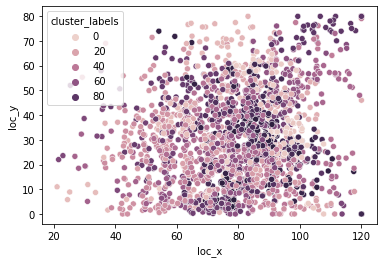

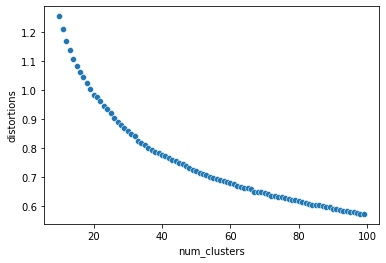

In [99]:
cl_p_o = in_df 
cl_cpass = pd.DataFrame(whiten(collected_passes))

dfs_clusterings = dict()
distortions = []
num_clusters = range(10,100)
for i in num_clusters:
    random.seed(0)
    cluster_centers, distortion = kmeans(cl_cpass, i)
    cl_p_o['cluster_labels'], distortion_list = vq(cl_cpass, cluster_centers)
    
    distortions.append(distortion)
    dfs_clusterings[str(i)] = cl_p_o
    
    print(f'num clusters: {i}')
    sns.scatterplot(x='loc_x', y='loc_y', data=cl_p_o, hue='cluster_labels')
    plt.show()
    
elbow_data = pd.DataFrame({'num_clusters':num_clusters, 'distortions':distortions})

sns.scatterplot(x='num_clusters', y='distortions', data=elbow_data)
plt.show()

In [41]:
#px.scatter(cl_p_o, x='loc_x', y='loc_y', color='pass_end_location_loc_x', facet_col='cluster_labels', facet_col_wrap=3, width=1000, height=1500)


In [43]:
dfs_clusterings['24']

,loc_x,loc_y,pass_end_location_loc_x,pass_end_location_loc_y,cluster_labels
91,102.2,21.2,107.5,30.5,7
110,92.9,21.9,84.2,34.7,16
121,94.2,26.2,100.1,45.5,10
132,79.7,55.9,85.7,50.6,3
173,56.2,49.0,52.5,45.6,12
...,...,...,...,...,...
991,64.7,18.8,112.2,11.2,23
994,80.4,14.4,91.7,4.3,1
1002,70.9,18.8,100.6,48.9,18
1013,83.3,28.2,90.2,18.1,9


In [69]:
selected_cluster_num = 24
df_selected = dfs_clusterings[str(selected_cluster_num)]
cluster_count = range(0,df_selected['cluster_labels'].max())

cl_freq = df_selected.groupby('cluster_labels').count()[['loc_x']].sort_values(by='loc_x', ascending=False)
cl_freq.columns = ['freq']
cl_freq['freq_pct'] = round(cl_freq['freq']/cl_freq['freq'].sum(),3)

cluster_pct = cl_freq['freq_pct'].tolist()
cluster_num = cl_freq.index.tolist()
display(cl_freq)

for i, cl in enumerate(cluster_num):
    df = cl_p_o[cl_p_o['cluster_labels']==cl]
    
    fig = socly.plot_passes(df, title=f"cluster {cl} - pct: {round(100*cluster_pct[i],1)}", show_outcome=False)
    fig.show()

,freq,freq_pct
cluster_labels,,
19,146,0.068
16,145,0.068
10,141,0.066
7,134,0.063
3,129,0.060
22,121,0.056
21,120,0.056
11,117,0.055
14,110,0.051


# Perfrom and Display Clustering Analysis

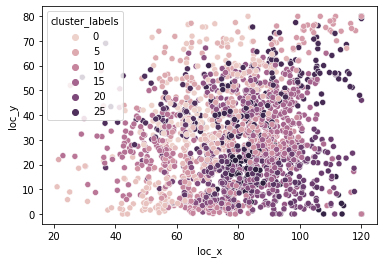

,freq,freq_pct
cluster_labels,,
9,147,0.069
15,126,0.059
17,102,0.048
19,93,0.043
18,92,0.043
13,92,0.043
10,84,0.039
27,82,0.038
26,81,0.038


In [2]:
#-------------------
# perform and display clustering analysis
#-------------------
df_season_passes = pd.read_pickle('messi_passes_season_1.pkl')

collected_passes = df_season_passes
#---
# which features to include
pass_cluster_feats = ['loc_x', 'loc_y', 'pass_end_location_loc_x',
                     'pass_end_location_loc_y', 'pass_angle']

feat_options = ['loc_x', 'loc_y', 'pass_end_location_loc_x',
                'pass_end_location_loc_y', 'pass_angle','pass_height', 'pass_length']
#---
collected_passes = sbut.expand_sb_location_col(collected_passes)
collected_passes = sbut.expand_sb_location_col(collected_passes, split_col='pass_end_location')
collected_passes = collected_passes[pass_cluster_feats]
cl_p_o = collected_passes

# standardized - not used now
cl_cpass = pd.DataFrame(whiten(cl_p_o))

# number of clusters to use
num_clusters = 30

# perform clustering and labeling
random.seed(0)
cluster_centers, distortion = kmeans(cl_cpass, num_clusters)
cl_p_o['cluster_labels'], distortion_list = vq(cl_cpass, cluster_centers)

# scatter plot with cluster colors
sns.scatterplot(x='loc_x', y='loc_y', data=cl_p_o, hue='cluster_labels')
plt.show()

# calculate frequency of occurrence for clusters
cl_freq = cl_p_o.groupby('cluster_labels').count()[['loc_x']].sort_values(by='loc_x', ascending=False)
cl_freq.columns = ['freq']
cl_freq['freq_pct'] = round(cl_freq['freq']/cl_freq['freq'].sum(),3)

# make plot for each cluster of passes
cluster_pct = cl_freq['freq_pct'].tolist()
cluster_num = cl_freq.index.tolist()
display(cl_freq)

for i, cl in enumerate(cluster_num):
    df = cl_p_o[cl_p_o['cluster_labels']==cl]
    
    fig = socly.plot_passes(df, title=f"cluster {cl} - pct: {round(100*cluster_pct[i],1)}", show_outcome=False)
    fig.show()

In [3]:
#------
# Vizualizing Cluster Centers
#------

cl_p_st = cl_p_o[pass_cluster_feats].std()

de_whitened_centers = np.multiply(cluster_centers,cl_p_st.to_numpy())
df_centers = pd.DataFrame(de_whitened_centers)
df_centers.columns = pass_cluster_feats
#--
df_centers = df_centers.join(cl_freq)
#--


# fig = px.scatter(df_centers, x='loc_x', y='loc_y', color='freq_pct', color_continuous_scale=["white", "red"])
# fig = socly.draw_pitch_lines(fig)
# fig.show()
fig = socly.plot_pass_clusters(df_centers, title=f"Cluster Centers - {num_clusters}", show_outcome=False)
fig.show()
# ---
display(df_centers)

,loc_x,loc_y,pass_end_location_loc_x,pass_end_location_loc_y,pass_angle,freq,freq_pct
0,60.972568,35.965341,75.237009,47.415236,-0.666515,72,0.034
1,75.770750,63.608727,69.916322,54.398414,2.184047,49,0.023
2,50.438091,6.963468,44.997347,16.278800,-2.084068,76,0.035
3,69.143539,25.014059,63.676509,37.240201,-2.103078,73,0.034
4,85.623379,57.932169,89.461563,69.707799,-1.322843,59,0.028
5,57.062301,51.779435,66.421629,68.903841,-1.080012,49,0.023
6,75.569565,44.064133,71.537855,55.705312,-1.999417,52,0.024
7,106.496955,74.077759,95.889828,65.731624,2.430493,43,0.020
8,61.173436,17.240645,70.437571,7.269303,0.850146,71,0.033
9,86.846805,29.568808,90.455131,42.841974,-1.230310,147,0.069


In [150]:
df_centers.join(cl_freq)

,loc_x,loc_y,pass_end_location_loc_x,pass_end_location_loc_y,pass_angle,freq,freq_pct
0,60.972568,35.965341,75.237009,47.415236,-0.666515,72,0.034
1,75.770750,63.608727,69.916322,54.398414,2.184047,49,0.023
2,50.438091,6.963468,44.997347,16.278800,-2.084068,76,0.035
3,69.143539,25.014059,63.676509,37.240201,-2.103078,73,0.034
4,85.623379,57.932169,89.461563,69.707799,-1.322843,59,0.028
5,57.062301,51.779435,66.421629,68.903841,-1.080012,49,0.023
6,75.569565,44.064133,71.537855,55.705312,-1.999417,52,0.024
7,106.496955,74.077759,95.889828,65.731624,2.430493,43,0.020
8,61.173436,17.240645,70.437571,7.269303,0.850146,71,0.033
9,86.846805,29.568808,90.455131,42.841974,-1.230310,147,0.069


### DBSCAN Sklearn

In [71]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler

In [72]:
#X = StandardScaler().fit_transform(collected_passes)
X = collected_passes

In [90]:
clustering = DBSCAN().fit(X)
set(clustering.labels_)

{-1}

In [91]:
clustering.labels_

array([-1, -1, -1, ..., -1, -1, -1])

In [78]:
collected_passes['cluster_dbscan'] = clustering.labels_

In [79]:
collected_passes

,loc_x,loc_y,pass_end_location_loc_x,pass_end_location_loc_y,cluster_labels,cluster_dbscan
91,102.2,21.2,107.5,30.5,7,0
110,92.9,21.9,84.2,34.7,16,0
121,94.2,26.2,100.1,45.5,10,0
132,79.7,55.9,85.7,50.6,3,0
173,56.2,49.0,52.5,45.6,12,0
...,...,...,...,...,...,...
991,64.7,18.8,112.2,11.2,23,-1
994,80.4,14.4,91.7,4.3,1,2
1002,70.9,18.8,100.6,48.9,18,-1
1013,83.3,28.2,90.2,18.1,9,0


<AxesSubplot:xlabel='loc_x', ylabel='loc_y'>

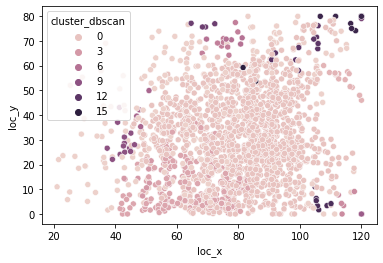

In [80]:
sns.scatterplot(x='loc_x', y='loc_y', data=collected_passes, hue='cluster_dbscan')

In [155]:
px.scatter(collected_passes, x='loc_x', y='loc_y', facet_col='cluster_dbscan')

In [156]:
selected_cluster = 3
df_clst_filter = collected_passes[collected_passes['cluster_dbscan']==selected_cluster]